In [1]:
import sys

sys.path.append("..")

In [2]:
import healpy_helper

In [3]:
import folium

In [4]:
import healpy as hp
import pandas as pd
import numpy as np
import geopandas as gpd

NEST = True

# the lowest resolution possible with the HEALPix base partitioning of the sphere surface into 12 equal sized pixels.
# Areas of all pixels at a given resolution are identical. 
for nside in [1, 2, 4, 8]:
    npix = hp.nside2npix(nside)
    print(f"Number of pixels (nside={nside}): {npix}")

for i in range(0, 10):
    # nside = 2**i
    nside = hp.order2nside(i)
    npix = hp.nside2npix(nside)
    print(f"Number (order={i}) of pixels (nside={nside}): {npix}")


    approx_res = hp.nside2resol(nside, arcmin=True) / 60
    print(f"Approximate resolution at NSIDE {nside} is {approx_res:.2} deg")

# high res pixel nums:
# 3145728 or even 12582912 pixels
for pix in [3145728, 12582912]:
    nside = hp.npix2nside(pix)
    ord = hp.nside2order(nside)
    print(f"Number of pixels (pix={pix}): {nside} | order: {ord}")

Number of pixels (nside=1): 12
Number of pixels (nside=2): 48
Number of pixels (nside=4): 192
Number of pixels (nside=8): 768
Number (order=0) of pixels (nside=1): 12
Approximate resolution at NSIDE 1 is 5.9e+01 deg
Number (order=1) of pixels (nside=2): 48
Approximate resolution at NSIDE 2 is 2.9e+01 deg
Number (order=2) of pixels (nside=4): 192
Approximate resolution at NSIDE 4 is 1.5e+01 deg
Number (order=3) of pixels (nside=8): 768
Approximate resolution at NSIDE 8 is 7.3 deg
Number (order=4) of pixels (nside=16): 3072
Approximate resolution at NSIDE 16 is 3.7 deg
Number (order=5) of pixels (nside=32): 12288
Approximate resolution at NSIDE 32 is 1.8 deg
Number (order=6) of pixels (nside=64): 49152
Approximate resolution at NSIDE 64 is 0.92 deg
Number (order=7) of pixels (nside=128): 196608
Approximate resolution at NSIDE 128 is 0.46 deg
Number (order=8) of pixels (nside=256): 786432
Approximate resolution at NSIDE 256 is 0.23 deg
Number (order=9) of pixels (nside=512): 3145728
Appro

In [5]:
lat = 58.3
lon = 26.6
nside = hp.order2nside(10)
v = healpy_helper._latlon2cellid(lat, lon, nside, nest=NEST)
print(v)

cell_ids = [920435]
nside = hp.order2nside(10)
v = healpy_helper._cellid2latlon(cell_ids, nside, nest=NEST)
print(v)


cell_ids = [920435]
nside = hp.order2nside(10)
v = healpy_helper._cellid2boundaries(cell_ids, nside, nest=NEST, as_geojson=True)
# beware lat/lon order vs geojson lon/lat
print(v)

920435
[[26.60583942 58.30286563]]
[[[58.35035346 26.57894737]
  [58.30286563 26.54014599]
  [58.2553722  26.63265306]
  [58.30286563 26.67153285]]]


In [6]:
list(v[0])[0]

array([58.35035346, 26.57894737])

In [7]:
def switch_polyline(polyline):
    switched = [(t[1], t[0]) for t in polyline]
    return switched

In [8]:
import copy

def visualize_polygon(polyline, color, lat_lon_order=True):
    pline = copy.deepcopy(polyline)
    pline.append(pline[0])
    if not lat_lon_order:
        pline=switch_polyline(pline)
    lat = [p[0] for p in pline]
    lng = [p[1] for p in pline]
    m = folium.Map(location=[sum(lat)/len(lat), sum(lng)/len(lng)], zoom_start=10, tiles='cartodbpositron')
    my_PolyLine=folium.PolyLine(locations=pline,weight=4,color=color)
    m.add_child(my_PolyLine)
    return m

In [9]:
visualize_polygon(list(v[0]), 'blue')

In [10]:
res = 5
v = healpy_helper.get_healpy_cells(res)
print(v)

       cell_id
0            0
1            1
2            2
3            3
4            4
...        ...
12283    12283
12284    12284
12285    12285
12286    12286
12287    12287

[12288 rows x 1 columns]


In [11]:
import pandas as pd
import geopandas as gpd

res = 10
df = pd.DataFrame({'cell_id': [921402]})
v = healpy_helper.create_healpy_geometry(df, res)
v


,cell_id,geometry
0,921402,"POLYGON ((27.31411 59.53576, 27.27273 59.48841..."


<Axes: >

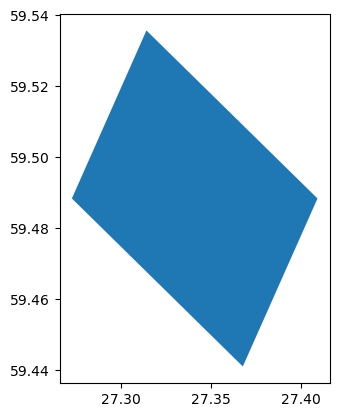

In [12]:
v.plot()

In [13]:
res = 5
df = healpy_helper.get_healpy_cells(res)
gdf = healpy_helper.create_healpy_geometry(df, res)

In [14]:
gdf['centroid'] = gdf.centroid

/var/folders/bx/bk2msp1d20l8hlyf4t08xqqc0000gn/T/ipykernel_55949/390209964.py:1: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf['centroid'] = gdf.centroid


In [15]:
c_gdf = gpd.GeoDataFrame(gdf.drop(columns=['geometry']).rename(columns={'centroid':'geometry'}), crs=4326)

In [16]:
c_gdf.explore()

In [17]:
res = 4
df = healpy_helper.get_healpy_cells(res)
gdf = healpy_helper.create_healpy_geometry(df, res)

In [18]:
gdf.explore()

In [20]:
from shapely.geometry import box

In [21]:
# xmin, ymin, xmax, ymax = 22.5, 57.3, 27.7, 59.9
xmin, ymin, xmax, ymax = -153.13244943186976, 59.958839286602725, -135.16614374947932, 64.99375489695795

extent_shape = box(xmin, ymin, xmax, ymax)

In [22]:
360-206.90293 

153.09707

In [23]:
224.83395-360

-135.16605

In [24]:
aoi = gpd.GeoDataFrame({'geometry':[extent_shape]}, crs=4326)

In [25]:
aoi.explore()

In [26]:
res = 10

nside = hp.order2nside(res)
npix = hp.nside2npix(nside)
m = np.arange(npix)

extent=[xmin, ymin, xmax, ymax]

approx_res = hp.nside2resol(nside, arcmin=True) / 60
xmin, ymin, xmax, ymax = extent
lon_diff = abs(xmax - xmin)
lat_diff = abs(ymax - ymin)


In [27]:
approx_res, lon_diff, lat_diff

(0.05725810686362343, 17.96630568239044, 5.0349156103552275)

In [28]:
# theta is (co-)latiude, phi is longitude when radians
# BUT apparently the order is other way round when lonlat True
ipix_corners = hp.ang2pix(nside=nside,
                          phi=[ymin, ymin, ymax, ymax],
                          theta=[xmin, xmax, xmin, xmax],nest=NEST, lonlat=True)
ipix_corners

array([3018722, 2936801, 3039911, 2948695])

In [29]:
df = pd.DataFrame({'cell_id': ipix_corners})
gdf = healpy_helper.create_healpy_geometry(df, res, as_geojson=False)
gdf

,cell_id,geometry
0,3018722,"POLYGON ((-153.09707 60.00899, -153.13846 59.9..."
1,2936801,"POLYGON ((-135.20801 60.00899, -135.27692 59.9..."
2,3039911,"POLYGON ((-153.09963 65.04167, -153.14917 64.9..."
3,2948695,"POLYGON ((-135.16605 65.04167, -135.24862 64.9..."


In [30]:
gdf.explore()

In [31]:
# spaced coords from min to max
theta = np.arange(ymin-approx_res, ymax+approx_res, approx_res)
phi = np.arange(xmin-approx_res, xmax+approx_res, approx_res/2)

In [32]:
phi.shape

(632,)

In [33]:
theta, phi = np.meshgrid(theta, phi)

In [34]:
# combinations to fill 2d space

# flatten/unravel to 1d?
ipix_grid = hp.ang2pix(nside=nside, theta=phi.flatten(), phi=theta.flatten(), nest=NEST, lonlat=True)

In [35]:
m = np.unique(np.concatenate([ipix_corners, ipix_grid]))

In [36]:
len(m)

13310

In [37]:
df = pd.DataFrame({'cell_id': m})
gdf = healpy_helper.create_healpy_geometry(df, res, as_geojson=False)

In [38]:
gdf.explore()

In [39]:
gdf

,cell_id,geometry
0,2932597,"POLYGON ((-143.08756 59.91438, -143.14417 59.8..."
1,2932598,"POLYGON ((-143.22581 59.91438, -143.28221 59.8..."
2,2932599,"POLYGON ((-143.16923 59.96169, -143.22581 59.9..."
3,2932601,"POLYGON ((-143.36406 59.91438, -143.42025 59.8..."
4,2932602,"POLYGON ((-143.50230 59.91438, -143.55828 59.8..."
...,...,...
13305,3039936,"POLYGON ((-152.26937 65.04167, -152.32044 64.9..."
13306,3039937,"POLYGON ((-152.21811 65.08846, -152.26937 65.0..."
13307,3040000,"POLYGON ((-150.94096 65.04167, -150.99448 64.9..."
13308,3040256,"POLYGON ((-148.28413 65.04167, -148.34254 64.9..."


In [89]:
import os
import pandas as pd

In [90]:
healpy_files = []
for a, b, c in os.walk("../cell_stats/results_healpy"):
    healpy_files = list(filter(lambda s: s.startswith('healpy_') and '.parquet' in s, c))

In [91]:
file_df = pd.DataFrame(healpy_files)

In [92]:
file_df = file_df.rename(columns={0: 'infile'})

In [93]:
file_df['outfile'] = file_df['infile'].apply(lambda s: s.replace('.parquet', '_step2.fgb'))

In [94]:
file_df.to_csv('../cell_stats/results_healpy/worklist.csv')

In [95]:
file_df.loc[0, 'infile']

'healpy_7_LAEA_sample_id_37.parquet'

In [96]:
import sys
import os
import math
import glob
import json

import functools

import numpy as np
import pandas as pd
import geopandas as gpd
from shapely import wkt
from shapely.geometry import Polygon, shape, Point, mapping
from shapely.ops import transform
import pyproj

In [97]:
sys.path.append("../cell_stats")

In [98]:
import compute_area_zsc_hpc as zsc

In [99]:
work_dir = '../cell_stats/results_healpy'
parquet_file_name = os.path.join( work_dir, file_df.loc[68, 'infile'])
parquet_file_name_step2 = os.path.join( work_dir, file_df.loc[68, 'outfile'])

In [100]:
df = pd.read_parquet(parquet_file_name)

df['geometry'] = df['wkt'].apply(lambda s: wkt.loads(s) if not s == "error" else None)

In [101]:
df

,cell_id,wkt,geometry
0,20479,"POLYGON ((135 41.8103148957786, 134.6484375 41...","POLYGON ((135 41.8103148957786, 134.6484375 41..."
1,22783,"POLYGON ((146.25 41.81031489577859, 145.898437...","POLYGON ((146.25 41.81031489577859, 145.898437..."
2,22847,"POLYGON ((151.875 41.81031489577859, 151.52343...","POLYGON ((151.875 41.81031489577859, 151.52343..."
3,22883,"POLYGON ((153.28125 41.81031489577859, 152.929...","POLYGON ((153.28125 41.81031489577859, 152.929..."
4,22888,"POLYGON ((152.578125 41.81031489577859, 152.22...","POLYGON ((152.578125 41.81031489577859, 152.22..."
...,...,...,...
401,28750,POLYGON ((137.78761061946904 47.74965082913658...,POLYGON ((137.78761061946904 47.74965082913658...
402,28752,POLYGON ((139.73684210526318 47.35757623319898...,POLYGON ((139.73684210526318 47.35757623319898...
403,28754,POLYGON ((139.38053097345133 47.74965082913658...,POLYGON ((139.38053097345133 47.74965082913658...
404,28768,POLYGON ((136.57894736842104 47.35757623319898...,POLYGON ((136.57894736842104 47.35757623319898...


In [102]:
gdf = gpd.GeoDataFrame(df, crs=4326)

In [103]:
gdf.explore()

In [ ]:

df = df.dropna(subset=['geometry'])

df['crossed'] = df['geometry'].apply(zsc.check_for_geom)


result = df['geometry'].apply(zsc.get_area_perimeter_from_lambert)
result = result.rename(columns={0: 'area', 1: 'perimeter'})
df = df.assign(area=result['area'], perimeter=result['perimeter'] )

df['c_orig'] = zsc.zsc_calculation_np(df, False)
df['zsc'] = zsc.zsc_calculation_np(df, True)

df = df[~df['area'].isna()]

result = df['geometry'].apply(lambda g: pd.Series((g.centroid.x, g.centroid.y)))
result = result.rename(columns={0: 'lon', 1: 'lat'})
df = df.assign(lon=result['lon'], lat=result['lat'] )

df = df.drop(columns=["geometry", 'wkt'])

df.to_parquet(parquet_file_name_step2, compression='gzip', index=False)